In [96]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from unet import UNet
from PIL import Image
from scipy.spatial import distance

In [4]:
physical_devices = tf.config.list_physical_devices('GPU')
physical_devices

[]

In [5]:
if physical_devices: tf.config.experimental.set_memory_growth(physical_devices[0], True)

In [6]:
size = 256, 144
checkpoint_dir = Path().cwd() / ".." / "weights" / "run1"

In [7]:
model = UNet(size)

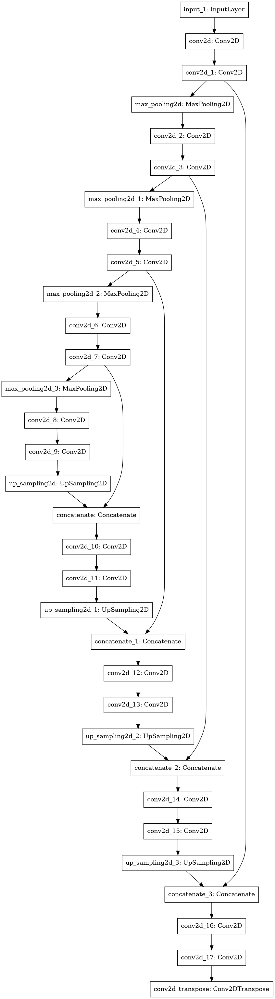

In [8]:
tf.keras.utils.plot_model(model, to_file = Path().cwd() / "unet.png", rankdir="TB")

In [9]:
latest = tf.train.latest_checkpoint(checkpoint_dir)
latest

'/home/paul/Documents/Education/covproject/src/../weights/run1/90.ckpt'

In [10]:
model.load_weights(latest)

In [7]:
model.layers

In [8]:
layer_outputs = [layer.output for layer in model.layers]

In [9]:
feature_map_model = tf.keras.Model(model.input, layer_outputs)

In [11]:
image = Image.open("../data/images/329.png")

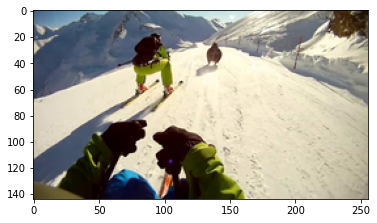

In [11]:
plt.imshow(image)

In [12]:
image_arr = np.array(image)
image_arr = image_arr.reshape((1,) + image_arr.shape)
image_arr.shape

(1, 144, 256, 3)

In [13]:
feature_maps = feature_map_model.predict(image_arr)

In [15]:
layer_names = [layer.name for layer in model.layers]
for layer_name, feature_map in zip(layer_names, feature_maps):print(f"The shape of the {layer_name} is =======>> {feature_map.shape}")

The shape of the input_1 is =======>> (1, 144, 256, 3)
The shape of the conv2d is =======>> (1, 144, 256, 16)
The shape of the conv2d_1 is =======>> (1, 144, 256, 16)
The shape of the max_pooling2d is =======>> (1, 72, 128, 16)
The shape of the conv2d_2 is =======>> (1, 72, 128, 32)
The shape of the conv2d_3 is =======>> (1, 72, 128, 32)
The shape of the max_pooling2d_1 is =======>> (1, 36, 64, 32)
The shape of the conv2d_4 is =======>> (1, 36, 64, 64)
The shape of the conv2d_5 is =======>> (1, 36, 64, 64)
The shape of the max_pooling2d_2 is =======>> (1, 18, 32, 64)
The shape of the conv2d_6 is =======>> (1, 18, 32, 128)
The shape of the conv2d_7 is =======>> (1, 18, 32, 128)
The shape of the max_pooling2d_3 is =======>> (1, 9, 16, 128)
The shape of the conv2d_8 is =======>> (1, 9, 16, 256)
The shape of the conv2d_9 is =======>> (1, 9, 16, 256)
The shape of the up_sampling2d is =======>> (1, 18, 32, 256)
The shape of the concatenate is =======>> (1, 18, 32, 384)
The shape of the conv2

In [14]:
def display(display_list, layer):
  fig, ax = plt.subplots(1, len(display_list))
  fig.set_size_inches(35, 15)
  for i in range(len(display_list)):
    try:
        ax[i].imshow(display_list[i])
    except TypeError:
        ax.imshow(display_list[i])
  plt.title(layer)
  plt.show()

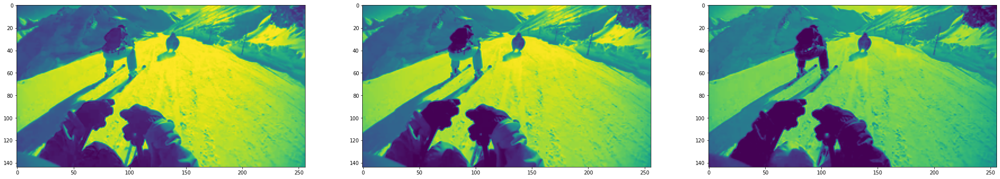

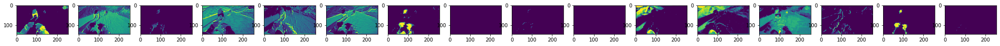

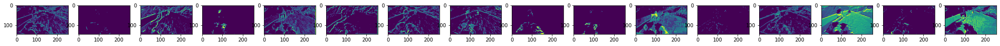

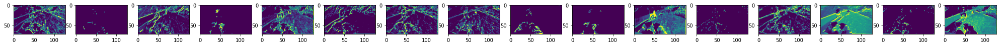

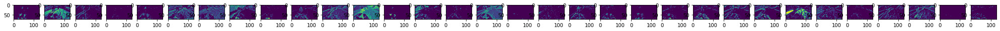

...

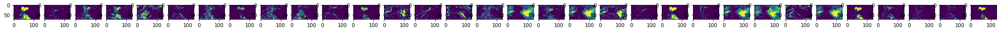

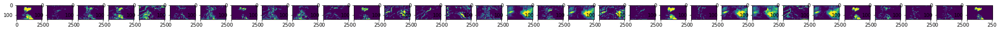

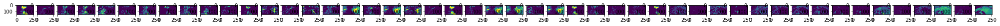

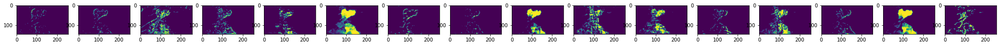

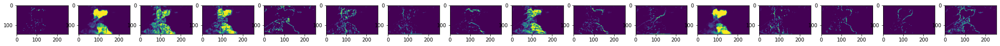

TypeError: 'AxesSubplot' object is not subscriptable

In [84]:
for layer_name, feature_map in zip(layer_names, feature_maps):
    if len(feature_map.shape) == 4:
        k = feature_map.shape[-1]
        images = []
        #iterating over a feature map of a particular layer to separate all feature images.
        for i in range(k):
            size=feature_map.shape[1]
            feature_image = feature_map[0, :, :, i]
            feature_image-= feature_image.mean()
            feature_image/= feature_image.std ()
            feature_image*=  64
            feature_image+= 128
            feature_image= np.clip(feature_image, 0, 255).astype('uint8')
            images.append(feature_image.squeeze())
        display(images, layer_name)

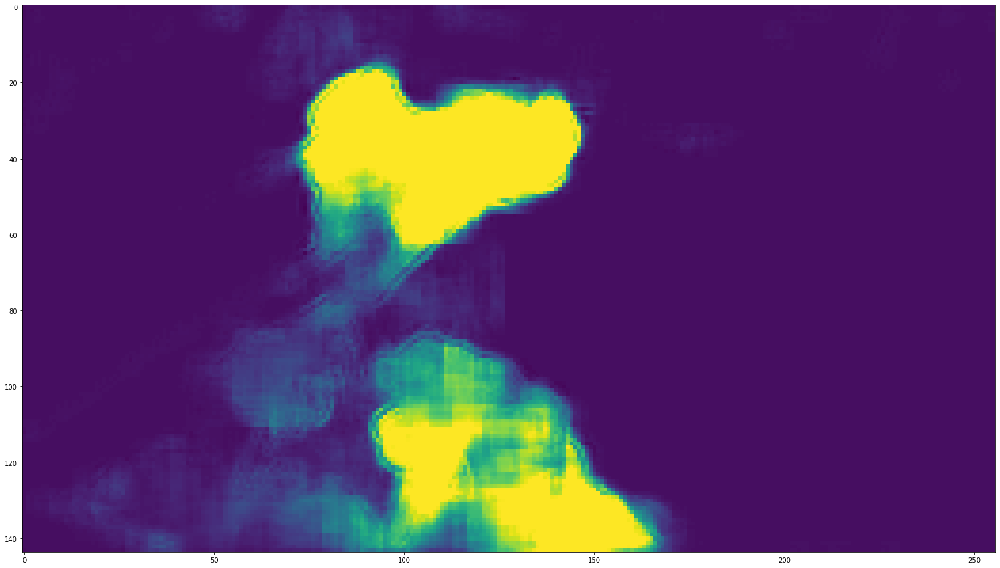

In [89]:
layer = 0
for layer_name, feature_map in list(zip(layer_names, feature_maps))[-1:]:
    if len(feature_map.shape) == 4:
        k = feature_map.shape[-1]
        images = []
        #iterating over a feature map of a particular layer to separate all feature images.
        for i in range(k):
            size=feature_map.shape[1]
            feature_image = feature_map[0, :, :, i]
            feature_image-= feature_image.mean()
            feature_image/= feature_image.std ()
            feature_image*=  64
            feature_image+= 128
            feature_image= np.clip(feature_image, 0, 255).astype('uint8')
            images.append(feature_image.squeeze())
        display(images, layer_name)

In [105]:
import pickle
from pathlib import Path
import pandas as pd

In [106]:
histories_path = Path().cwd() / ".." / "histories" / "run1"

PosixPath('/home/paul/Documents/Education/covproject/src/../histories/run1')

In [116]:
histories = []
for f in sorted(list(histories_path.glob("*.pickle"))):
    histories.append(pickle.load(open(f, "rb")))
df = pd.DataFrame(histories).explode("loss").explode("mse").explode("val_loss").explode("val_mse")
df

,loss,mse,val_loss,val_mse
0,4019.767685,4019.767334,4264.422112,4264.421875
1,3675.978546,3675.978271,4258.572738,4258.57373
2,3464.414902,3464.414795,3923.688952,3923.688721
3,3249.650452,3249.650635,3611.591074,3611.591064
4,3123.249039,3123.249023,3433.668073,3433.667725
...,...,...,...,...
95,1902.573486,1902.573608,2401.386334,2401.386719
96,2154.270302,2154.270508,2350.6811,2350.681396
97,1995.469376,1995.469238,2418.913269,2418.913086
98,1855.214828,1855.214844,2397.318097,2397.317871


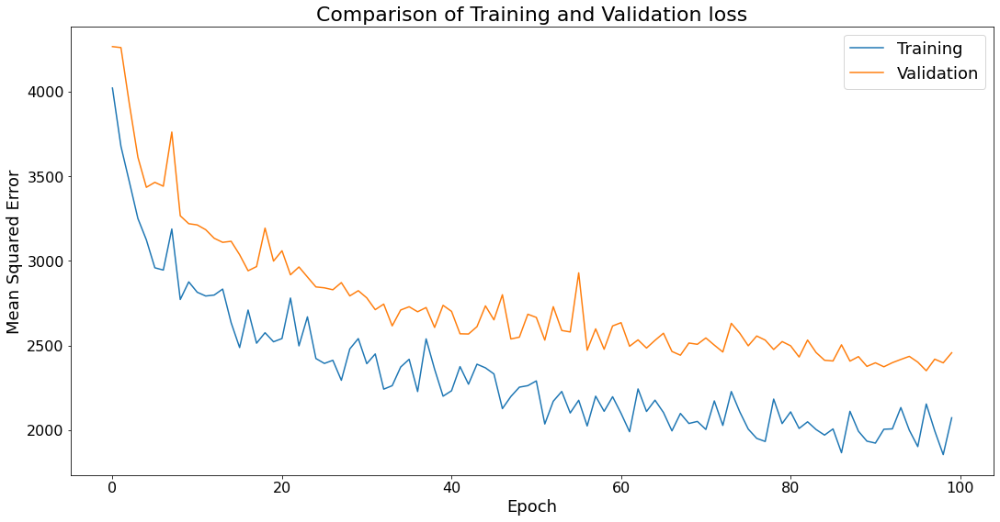

In [146]:
fig, ax = plt.subplots()
df[["mse", "val_mse"]].plot(figsize=(18,9), ax=ax)
ax.set_title("Comparison of Training and Validation loss", fontsize=22)
ax.legend(["Training", "Validation"], fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax.set_xlabel("Epoch", fontsize=18)
ax.set_ylabel("Mean Squared Error", fontsize=18)
fig.savefig("training.png")

In [95]:
image = Image.open("../data/images/350.png")
truth = Image.open("../data/masks/350.png")

In [21]:
prediction = model.predict(np.expand_dims(np.array(image), axis=0))

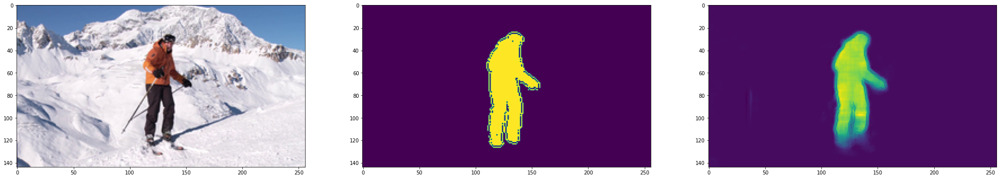

In [22]:
display([image, truth, prediction.squeeze()], "")

In [72]:
n_pred = prediction - prediction.min()
n_pred /= n_pred.max()
n_pred *= 255
plt.imshow(n_pred.suqeeze())

AttributeError: 'numpy.ndarray' object has no attribute 'suqeeze'

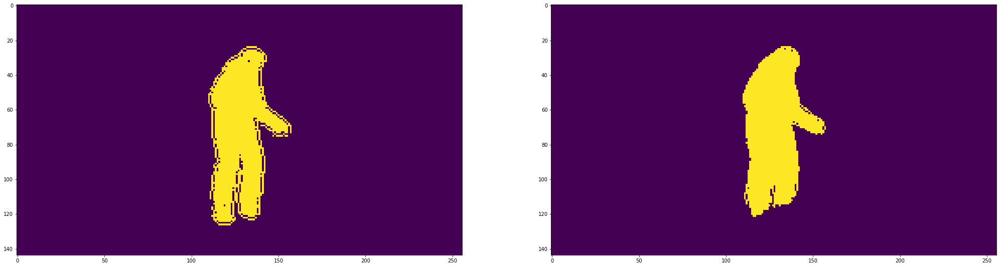

In [92]:
threshold = 100
t_pred = n_pred.copy()
t_pred[n_pred <= threshold] = 0
t_pred[n_pred > threshold] = 255
display([truth, t_pred.squeeze()], "")

In [93]:
intersection = np.logical_and(truth, t_pred.squeeze())
union = np.logical_or(truth, t_pred.squeeze())
iou_score = np.sum(intersection) / np.sum(union)
iou_score

0.8501742160278746

In [102]:
1 - distance.jaccard(t_pred.squeeze().flatten(), np.array(truth).flatten())

0.8501742160278746